## Libraries

In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Check top 45 countries

In [97]:
df = pd.read_csv("../output/1_data_exploration.csv")
df

,country,year,iso_code,population,gdp,primary_energy_consumption,cement_co2,coal_co2,consumption_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,other_industry_co2,trade_co2,cumulative_co2_including_luc,co2_including_luc
0,Argentina,1850,ARG,1088372.0,2.193400e+09,NaN,NaN,NaN,NaN,NaN,NaN,11.576,NaN,NaN,NaN,NaN,NaN
1,Argentina,1851,ARG,1115018.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.035,NaN,NaN,NaN,NaN,NaN
2,Argentina,1852,ARG,1138141.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.062,NaN,NaN,NaN,NaN,NaN
3,Argentina,1853,ARG,1157536.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.150,NaN,NaN,NaN,NaN,NaN
4,Argentina,1854,ARG,1177263.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.177,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8422,Vietnam,2018,VNM,94914328.0,6.815014e+11,1083.274,49.637,122.121,163.236,1.373,18.554,247.029,66.036,NaN,-94.486,12087.070,504.751
8423,Vietnam,2019,VNM,95776712.0,7.316531e+11,1202.636,56.538,191.443,211.240,1.453,18.906,248.054,73.449,NaN,-130.548,12676.914,589.843
8424,Vietnam,2020,VNM,96648680.0,7.526296e+11,1204.393,60.066,215.817,224.800,1.257,16.931,249.736,69.272,NaN,-138.543,13289.992,613.079
8425,Vietnam,2021,VNM,97468024.0,7.719120e+11,1208.554,62.071,211.893,227.044,0.995,13.757,252.922,63.838,NaN,-125.509,13895.467,605.475


1. Check numerical values. Look for missing values.

In [98]:
#function to check missing values
def missing_values(df):
    return df.isna().sum()/df.shape[0]*100

In [99]:
missing_values(df)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       1.863059
gdp                             36.133855
primary_energy_consumption      70.986116
cement_co2                      42.470630
coal_co2                        19.686721
consumption_co2                 83.683399
flaring_co2                     19.034057
gas_co2                         19.034057
land_use_change_co2              7.618370
oil_co2                         19.034057
other_industry_co2              89.616708
trade_co2                       83.683399
cumulative_co2_including_luc    24.279103
co2_including_luc               24.279103
dtype: float64

2. Charts co2 by year by top 45 countries

In [100]:
#function to check missing values on line chart based on choosing column 'CO2 Emissions'
def line_chart_missing_values(df, column, column_name):
    countries = df.groupby('country')[column].max().sort_values(ascending=False).index
    num_countries = len(countries)
    num_cols = 5  # Number of columns for the subplot grid
    num_rows = (num_countries - 1) // num_cols + 1  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 25), squeeze=False)

    for i, country in enumerate(countries):
        country_df = df[df['country'] == country]
        row = i // num_cols
        col = i % num_cols
        ax = axs[row, col]

        first_year_nonnull_co2 = country_df.loc[country_df[column].notnull(), 'year'].min()
        missing_years = country_df[country_df[column].isnull()]['year'] 

        ax.plot(country_df['year'], country_df[column])
        ax.set_title(f'CO2 Emissions Over Time in {country}')
        ax.set_xlabel('Year')
        ax.set_ylabel(column_name)
        ax.grid(True)

        # Plotting missing years as vertical lines
        for year in missing_years:
            ax.axvline(x=year, color='r', linestyle='--', alpha=0.5)  # Vertical lines for missing years
        
        # Adding text annotation for missing years
        if not missing_years.empty:
            missing_text = f"Missing years: {', '.join(map(str, missing_years))}"
            ax.text(0.5, -0.3, missing_text, ha='center', va='top', fontsize=8, color='red', transform=ax.transAxes)

        # Adding a marker for the first year with non-zero CO2
        if not pd.isna(first_year_nonnull_co2):
            ax.scatter([first_year_nonnull_co2], [country_df.loc[country_df['year'] == first_year_nonnull_co2, column].iloc[0]], color='red', zorder=5)
            ax.annotate(first_year_nonnull_co2, xy=(first_year_nonnull_co2, country_df.loc[country_df['year'] == first_year_nonnull_co2, column].iloc[0]), xytext=(0, -12), 
                        textcoords='offset points', ha='center', fontsize=8, color='red')

    plt.tight_layout()
    plt.show()

In [101]:
def process_country_data_before(country_df, column):
    # Identify the first non-null year
    first_nonnull_year = country_df.loc[country_df[column].notnull(), 'year'].min()
    
    # Filter out all years before the first non-null year
    return country_df[country_df['year'] >= first_nonnull_year]

def process_country_data_after(country_df, column):
    # Identify the first non-null year
    first_nonnull_year = country_df.loc[country_df[column].notnull(), 'year'].min()

    # Filter out all years before and including the first non-null year
    filtered_df = country_df[country_df['year'] >= first_nonnull_year]

    # Remove any rows with missing values
    return filtered_df.dropna(subset=[column])

# Function to fill missing values
def process_country_data_fill(country_df, column):
    # Fill missing values using linear interpolation
    country_df[column] = country_df[column].interpolate(method='linear')
    
    return country_df

# Apply the function to each country
def apply_process_country_data(df, column, process_function):
    processed_dfs = []

    for country in df['country'].unique():
        country_df = df[df['country'] == country]
        processed_df = process_function(country_df, column)
        processed_dfs.append(processed_df)

    # Concatenate the processed dataframes
    processed_df = pd.concat(processed_dfs).reset_index(drop=True)

    return processed_df

2a. Check 'co2_including_luc' column

In [102]:
column_co2 = 'co2_including_luc'
column_name_co2 = 'CO2 Emissions'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/854267004.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


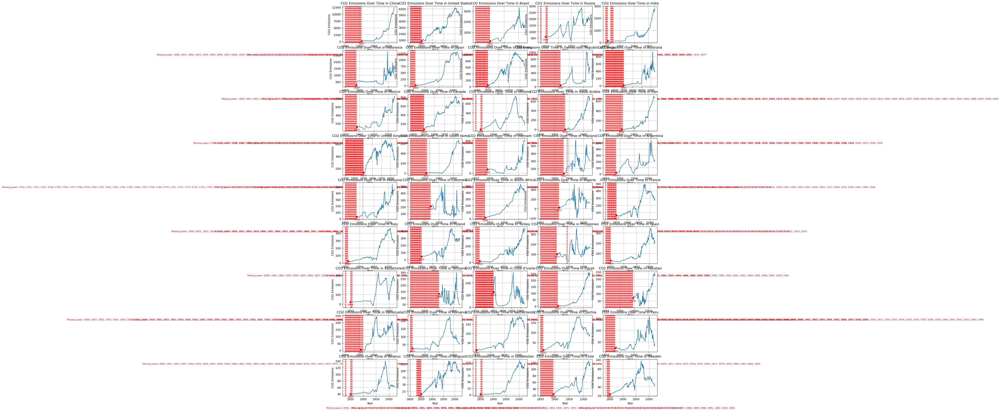

In [103]:
line_chart_missing_values(df, column_co2, column_name_co2)

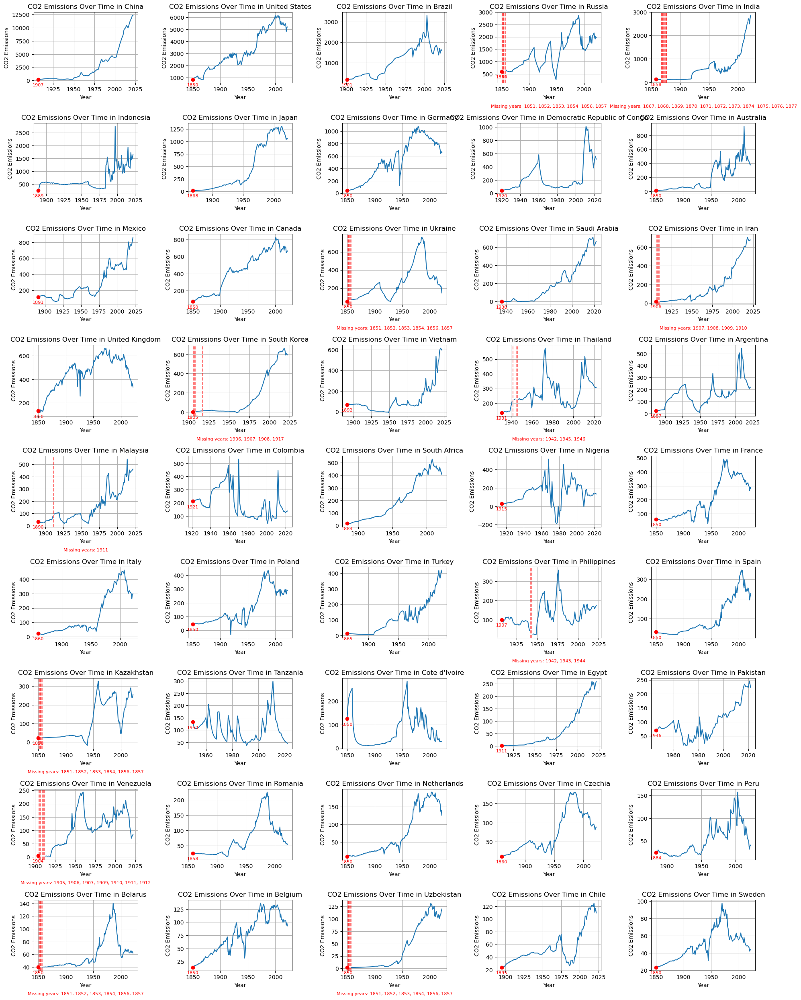

In [104]:
# Process data by removing missing values before the first non-null value
processed1_df_before = apply_process_country_data(df, column_co2, process_country_data_before)
line_chart_missing_values(processed1_df_before, column_co2, column_name_co2)

In [105]:
missing_values(processed1_df_before)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.873991
primary_energy_consumption      62.057728
cement_co2                      27.157045
coal_co2                         2.529485
consumption_co2                 78.662322
flaring_co2                      2.529485
gas_co2                          2.529485
land_use_change_co2              0.000000
oil_co2                          2.529485
other_industry_co2              86.421477
trade_co2                       78.662322
cumulative_co2_including_luc     0.977654
co2_including_luc                0.977654
dtype: float64

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/4119415066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_df[column] = country_df[column].interpolate(method='linear')


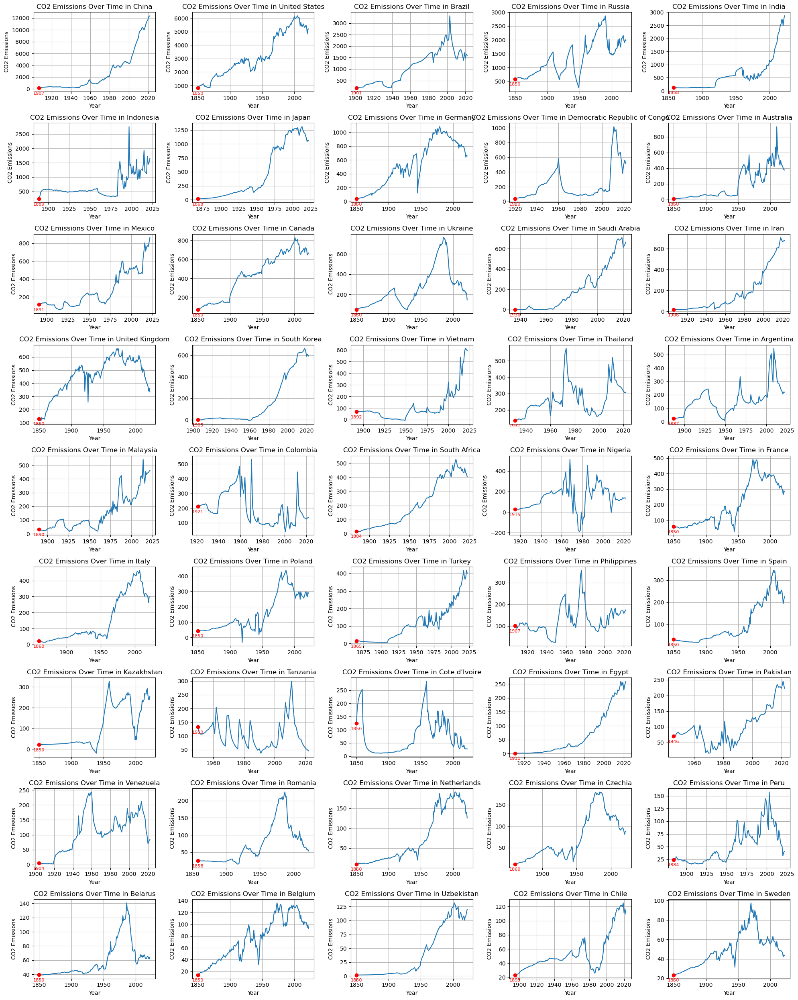

In [106]:
# Process data by filling missing values - only 0.97% are missing 
processed1_df_fill = apply_process_country_data(processed1_df_before, column_co2, process_country_data_fill)
line_chart_missing_values(processed1_df_fill, column_co2, column_name_co2)

In [107]:
missing_values(processed1_df_fill)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.873991
primary_energy_consumption      62.057728
cement_co2                      27.157045
coal_co2                         2.529485
consumption_co2                 78.662322
flaring_co2                      2.529485
gas_co2                          2.529485
land_use_change_co2              0.000000
oil_co2                          2.529485
other_industry_co2              86.421477
trade_co2                       78.662322
cumulative_co2_including_luc     0.977654
co2_including_luc                0.000000
dtype: float64

2b. Remove columns with missing values ​​greater than 50% + 'iso_code' column which is not significant

In [113]:
processed2_df = processed1_df_fill.drop(columns={'iso_code', 'primary_energy_consumption', 'consumption_co2', 'other_industry_co2', 'trade_co2'})
processed2_df

,country,year,population,gdp,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,cumulative_co2_including_luc,co2_including_luc
0,Argentina,1887,3061098.0,NaN,NaN,1.085,0.000,0.000,21.115,0.000,22.199,22.199
1,Argentina,1888,3158873.0,NaN,NaN,0.890,0.000,0.000,21.114,0.000,44.204,22.005
2,Argentina,1889,3260729.0,NaN,NaN,1.755,0.000,0.000,21.345,0.000,67.304,23.100
3,Argentina,1890,3366831.0,1.300098e+10,NaN,1.370,0.000,0.000,23.145,0.000,91.819,24.516
4,Argentina,1891,3477345.0,NaN,NaN,0.938,0.000,0.000,24.614,0.000,117.371,25.552
...,...,...,...,...,...,...,...,...,...,...,...,...
6439,Vietnam,2018,94914328.0,6.815014e+11,49.637,122.121,1.373,18.554,247.029,66.036,12087.070,504.751
6440,Vietnam,2019,95776712.0,7.316531e+11,56.538,191.443,1.453,18.906,248.054,73.449,12676.914,589.843
6441,Vietnam,2020,96648680.0,7.526296e+11,60.066,215.817,1.257,16.931,249.736,69.272,13289.992,613.079
6442,Vietnam,2021,97468024.0,7.719120e+11,62.071,211.893,0.995,13.757,252.922,63.838,13895.467,605.475


In [110]:
missing_values(processed2_df)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                             22.269237
cement_co2                      26.437862
coal_co2                         1.567152
flaring_co2                      1.567152
gas_co2                          1.567152
land_use_change_co2              0.000000
oil_co2                          1.567152
cumulative_co2_including_luc     0.000000
co2_including_luc                0.000000
dtype: float64

2c. Check 'coal_co2' column

In [114]:
column_coal = 'coal_co2'
column_name_coal = 'CO2 Coal'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/854267004.py:40: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


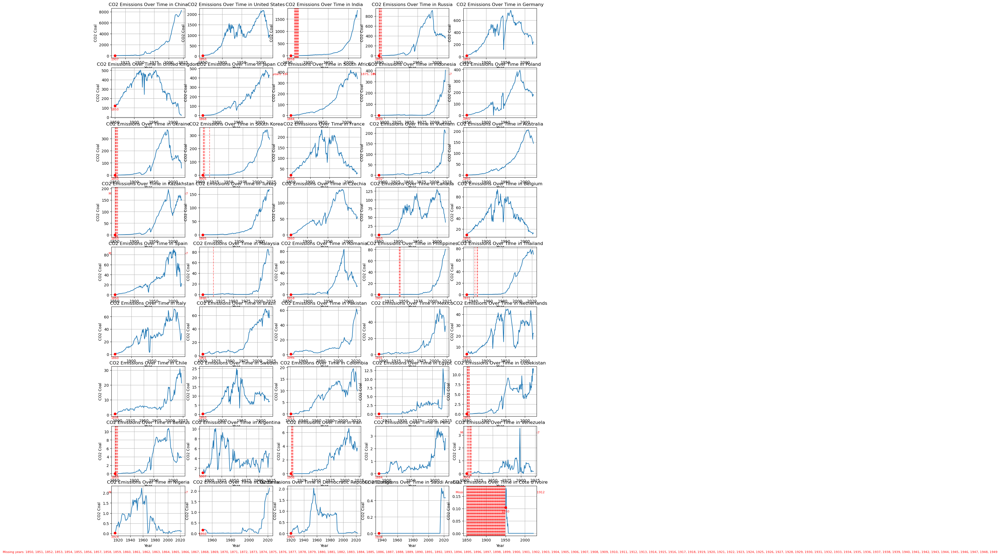

In [115]:
line_chart_missing_values(processed2_df, column_coal, column_name_coal)

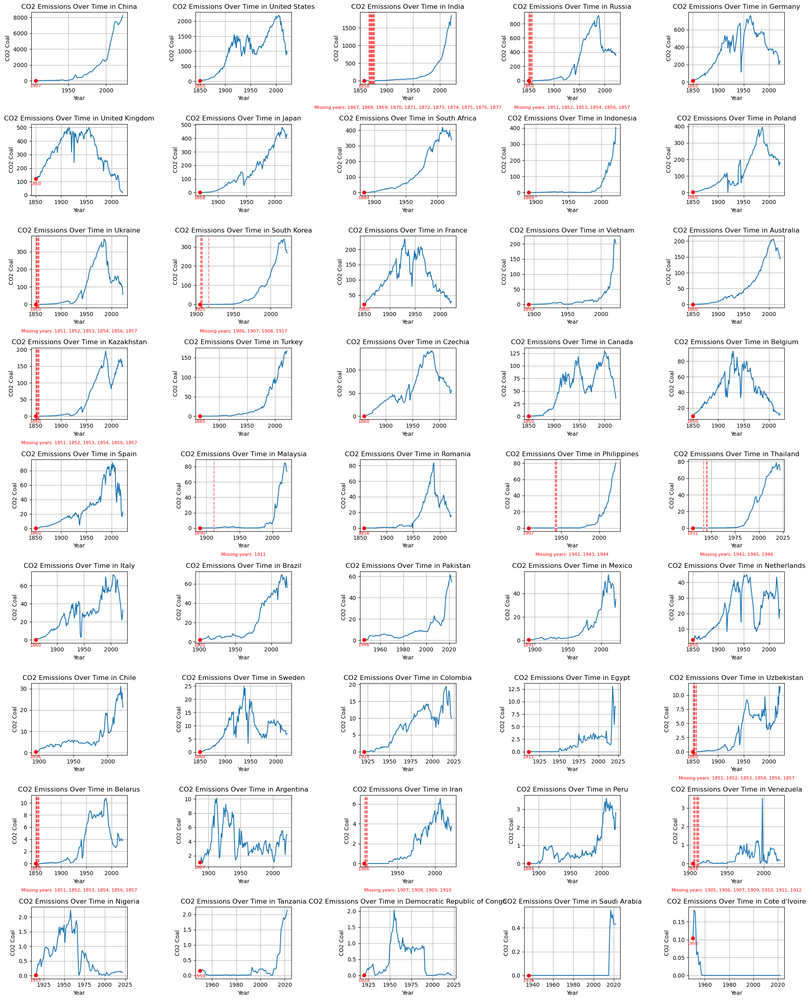

In [116]:
# Process data by removing missing values before the first non-null value
processed3_df_before = apply_process_country_data(processed2_df, column_coal, process_country_data_before)
line_chart_missing_values(processed3_df_before, column_coal, column_name_coal)

In [117]:
missing_values(processed3_df_before)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                             21.658260
cement_co2                      27.585120
coal_co2                         0.993064
flaring_co2                      0.993064
gas_co2                          0.993064
land_use_change_co2              0.000000
oil_co2                          0.993064
cumulative_co2_including_luc     0.993064
co2_including_luc                0.000000
dtype: float64

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/4119415066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_df[column] = country_df[column].interpolate(method='linear')


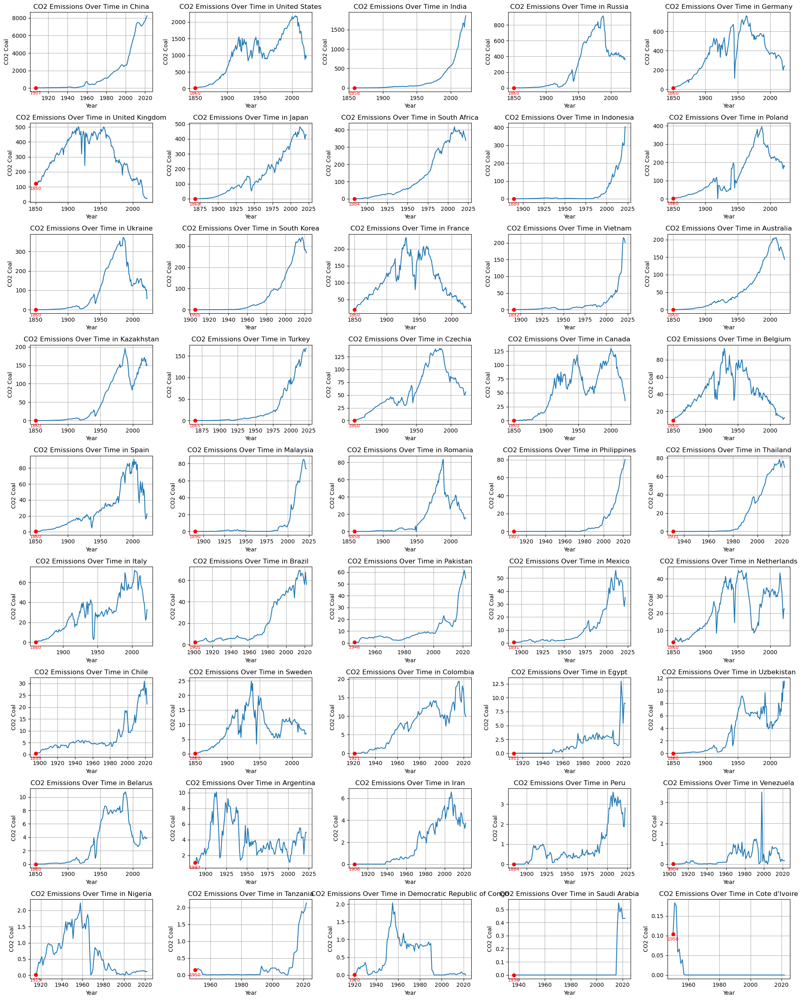

In [120]:
# Process data by filling missing values - only 0.99% are missing  (because this is the same % for flaring_co2, gas_co2, oil_co2 and cumulative_co2_including_luc I use fill to all of that columns)
processed3a_df_fill = apply_process_country_data(processed3_df_before, 'flaring_co2', process_country_data_fill)
processed3b_df_fill = apply_process_country_data(processed3a_df_fill, 'gas_co2', process_country_data_fill)
processed3c_df_fill = apply_process_country_data(processed3b_df_fill, 'oil_co2', process_country_data_fill)
processed3d_df_fill = apply_process_country_data(processed3c_df_fill, 'cumulative_co2_including_luc', process_country_data_fill)
processed3_df_fill = apply_process_country_data(processed3d_df_fill, column_coal, process_country_data_fill)
line_chart_missing_values(processed3_df_fill, column_coal, column_name_coal)

In [121]:
missing_values(processed3_df_fill)

country                          0.00000
year                             0.00000
population                       0.00000
gdp                             21.65826
cement_co2                      27.58512
coal_co2                         0.00000
flaring_co2                      0.00000
gas_co2                          0.00000
land_use_change_co2              0.00000
oil_co2                          0.00000
cumulative_co2_including_luc     0.00000
co2_including_luc                0.00000
dtype: float64

2d. Check 'gdp' column

In [122]:
column_gdp = 'gdp'
column_name_gdp = 'GDP'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/854267004.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


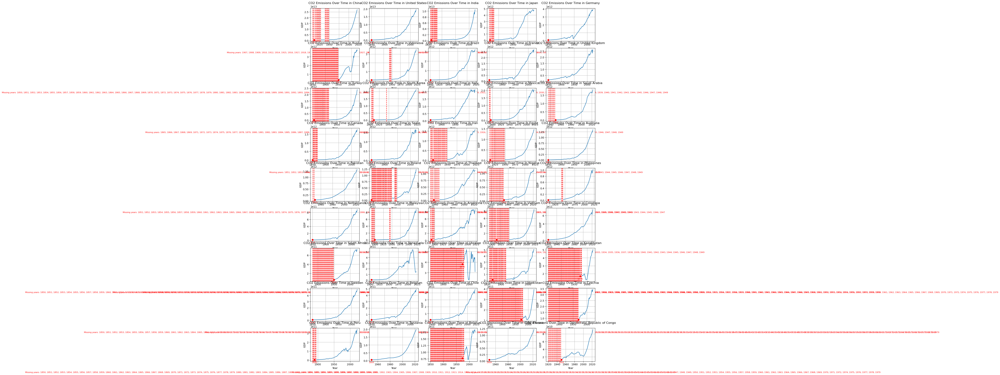

In [123]:
line_chart_missing_values(processed3_df_fill, column_gdp, column_name_gdp)

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/854267004.py:40: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


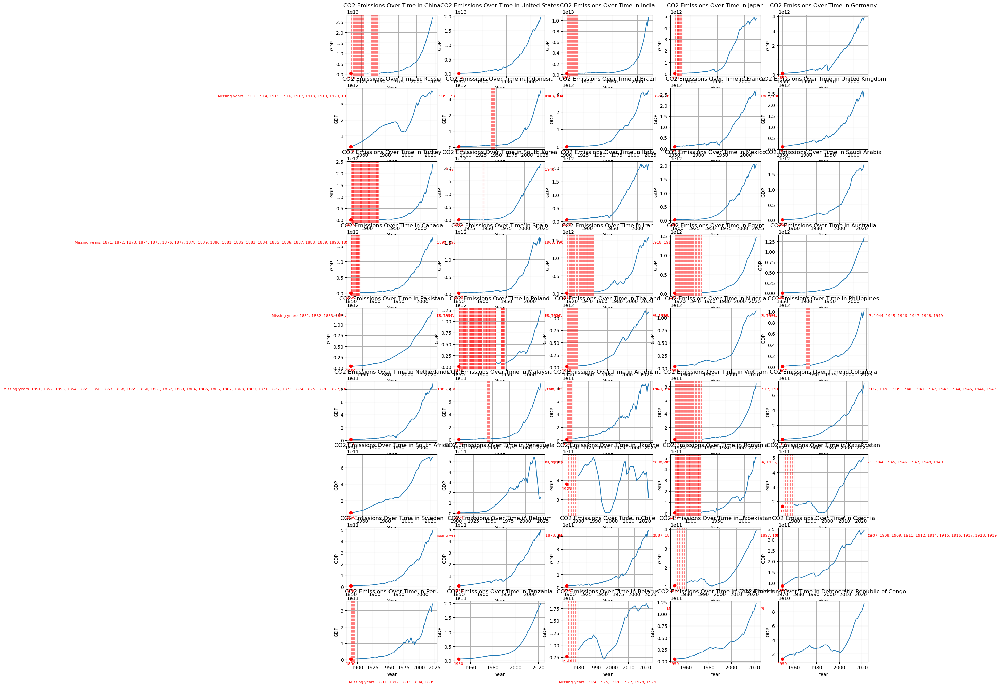

In [124]:
# Process data by removing missing values before the first non-null value
processed4_df_before = apply_process_country_data(processed3_df_fill, column_gdp, process_country_data_before)
line_chart_missing_values(processed4_df_before, column_gdp, column_name_gdp)

In [125]:
missing_values(processed4_df_before)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                              7.980004
cement_co2                      23.217923
coal_co2                         0.000000
flaring_co2                      0.000000
gas_co2                          0.000000
land_use_change_co2              0.000000
oil_co2                          0.000000
cumulative_co2_including_luc     0.000000
co2_including_luc                0.000000
dtype: float64

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/4119415066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_df[column] = country_df[column].interpolate(method='linear')


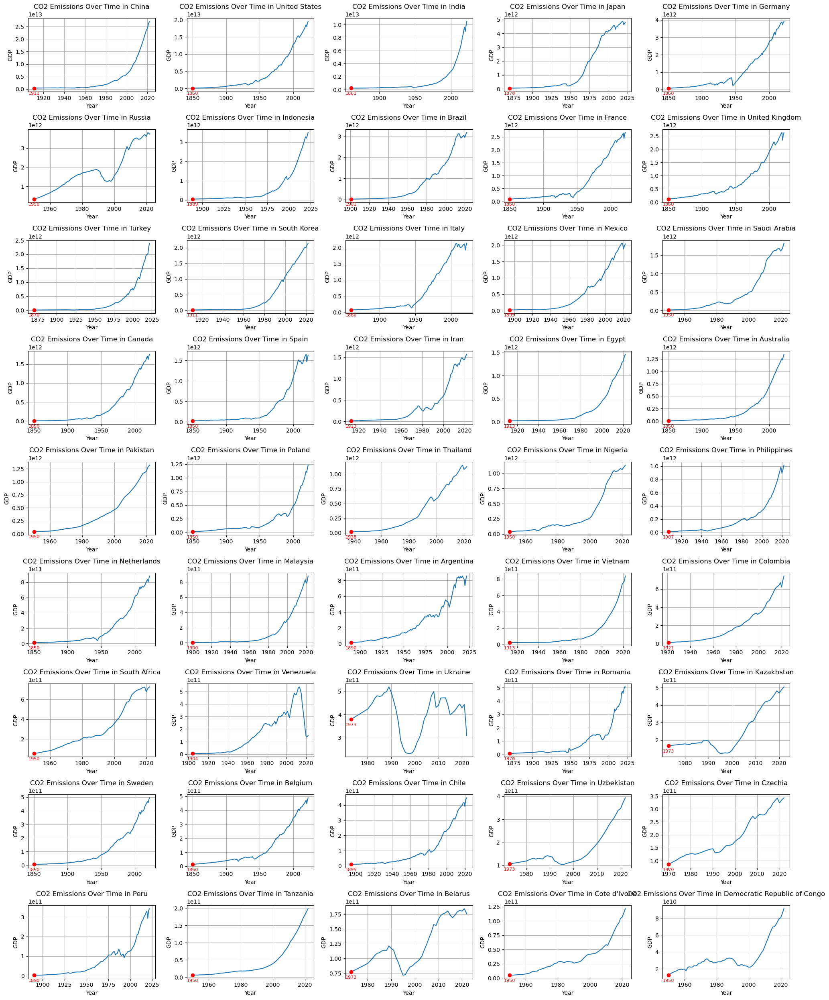

In [126]:
# Process data by filling missing values - most missing values are flat so I will try filling missing values
processed4_df_fill = apply_process_country_data(processed4_df_before, column_gdp, process_country_data_fill)
line_chart_missing_values(processed4_df_fill, column_gdp, column_name_gdp)

In [131]:
missing_values(processed4_df_fill)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                              0.000000
cement_co2                      23.217923
coal_co2                         0.000000
flaring_co2                      0.000000
gas_co2                          0.000000
land_use_change_co2              0.000000
oil_co2                          0.000000
cumulative_co2_including_luc     0.000000
co2_including_luc                0.000000
dtype: float64

2e. Check 'cement_co2' column

In [132]:
column_cement = 'cement_co2'
column_name_cement = 'CO2 Cement'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/854267004.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


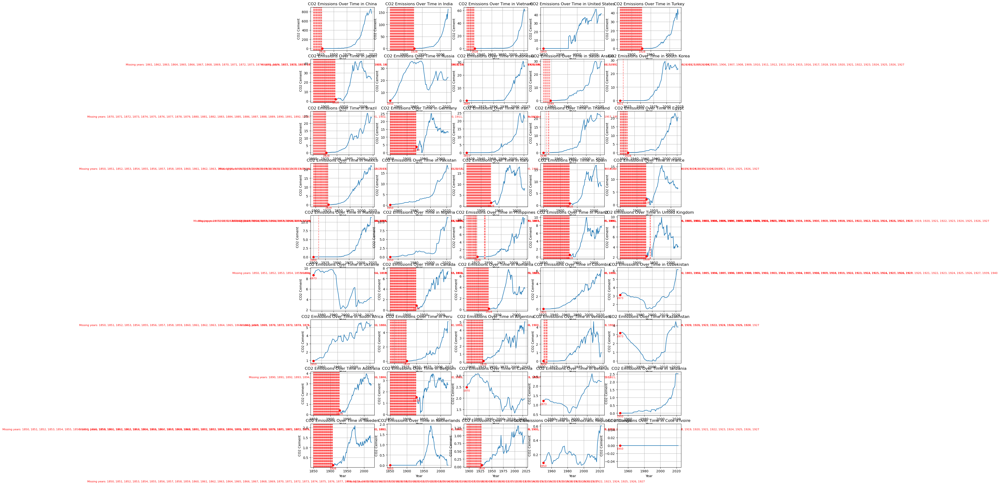

In [133]:
line_chart_missing_values(processed4_df_fill, column_cement, column_name_cement)

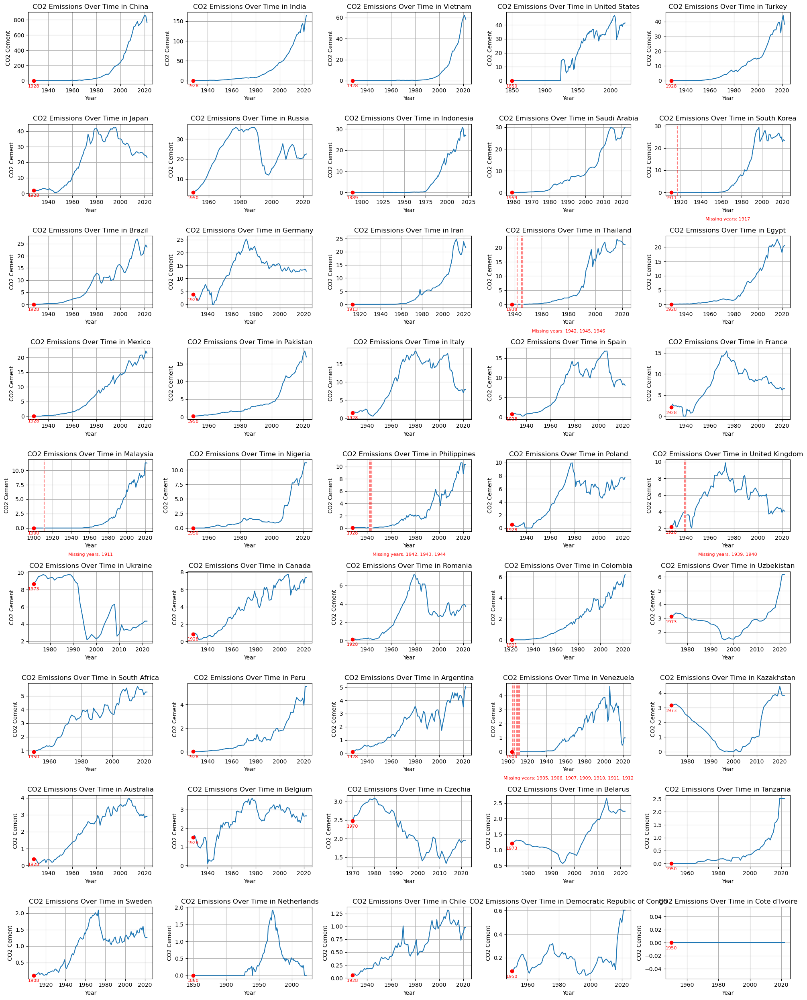

In [134]:
# Process data by removing missing values before the first non-null value
processed5_df_before = apply_process_country_data(processed4_df_fill, column_cement, process_country_data_before)
line_chart_missing_values(processed5_df_before, column_cement, column_name_cement)

In [135]:
missing_values(processed5_df_before)

country                         0.000000
year                            0.000000
population                      0.000000
gdp                             0.000000
cement_co2                      0.408261
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
cumulative_co2_including_luc    0.000000
co2_including_luc               0.000000
dtype: float64

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_36485/4119415066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_df[column] = country_df[column].interpolate(method='linear')


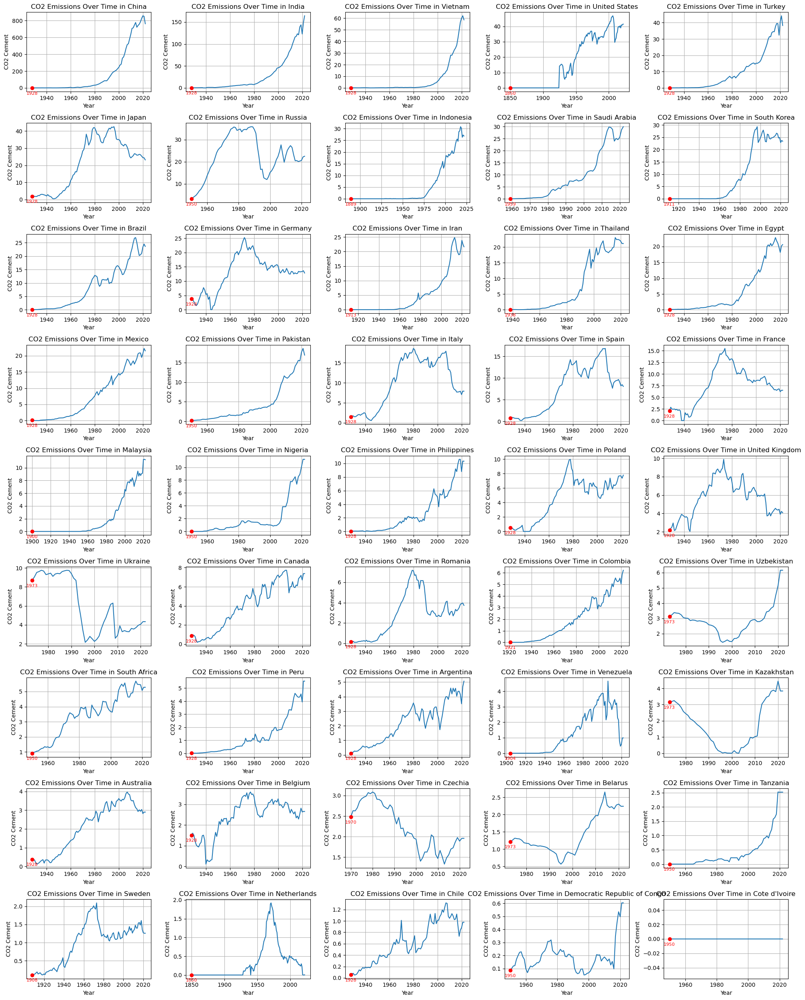

In [136]:
# Process data by filling missing values - only 0.4% missing
processed5_df_fill = apply_process_country_data(processed5_df_before, column_cement, process_country_data_fill)
line_chart_missing_values(processed5_df_fill, column_cement, column_name_cement)

In [137]:
missing_values(processed5_df_fill)

country                         0.0
year                            0.0
population                      0.0
gdp                             0.0
cement_co2                      0.0
coal_co2                        0.0
flaring_co2                     0.0
gas_co2                         0.0
land_use_change_co2             0.0
oil_co2                         0.0
cumulative_co2_including_luc    0.0
co2_including_luc               0.0
dtype: float64

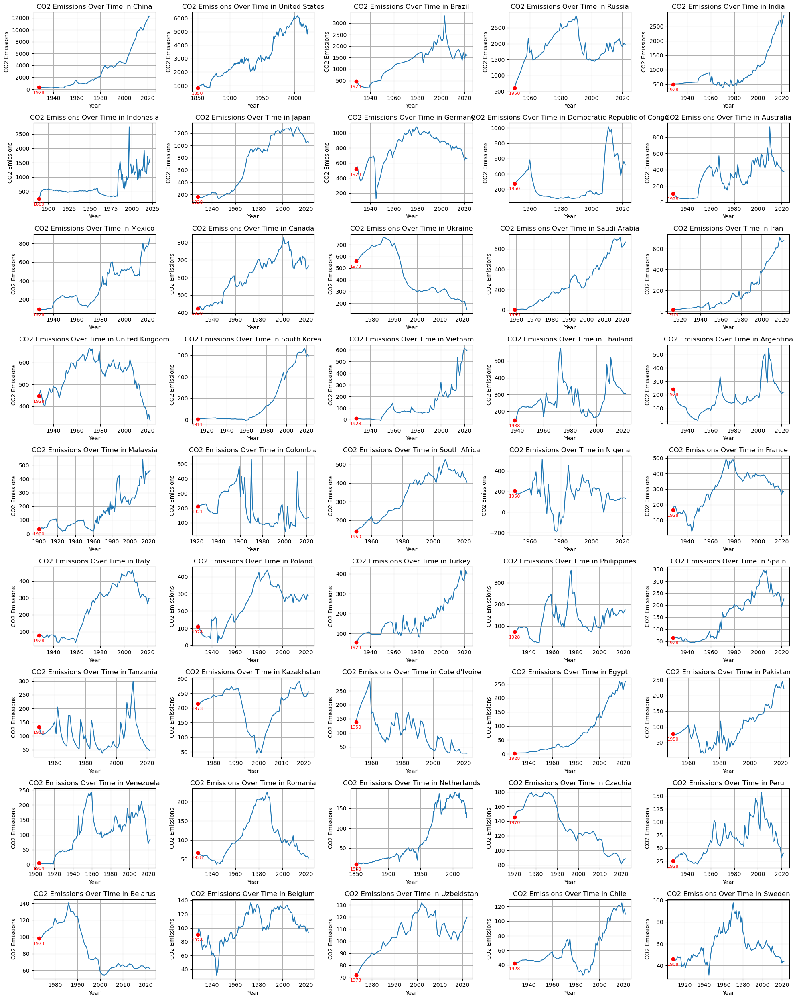

In [138]:
#Final co2 emission line charts
line_chart_missing_values(processed5_df_fill, column_co2, column_name_co2)

In [139]:
#when I removed all missing values - 3998 stayed
#when I filled missing values - 4164 stayed
#I saved 4% of data
processed5_df_fill

,country,year,population,gdp,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,cumulative_co2_including_luc,co2_including_luc
0,Argentina,1928,11139114.0,7.716888e+10,0.116,8.284,0.000,0.297,228.958,4.041,5108.347,241.697
1,Argentina,1929,11443159.0,8.069191e+10,0.174,8.321,0.000,0.458,229.748,4.177,5351.226,242.878
2,Argentina,1930,11726853.0,7.735969e+10,0.189,8.119,0.000,0.454,181.910,4.005,5545.904,194.678
3,Argentina,1931,11989069.0,7.199214e+10,0.265,6.947,0.000,0.564,150.371,5.067,5709.119,163.215
4,Argentina,1932,12228636.0,6.962483e+10,0.247,6.331,0.000,0.769,132.840,5.752,5855.059,145.940
...,...,...,...,...,...,...,...,...,...,...,...,...
4159,Vietnam,2018,94914328.0,6.815014e+11,49.637,122.121,1.373,18.554,247.029,66.036,12087.070,504.751
4160,Vietnam,2019,95776712.0,7.316531e+11,56.538,191.443,1.453,18.906,248.054,73.449,12676.914,589.843
4161,Vietnam,2020,96648680.0,7.526296e+11,60.066,215.817,1.257,16.931,249.736,69.272,13289.992,613.079
4162,Vietnam,2021,97468024.0,7.719120e+11,62.071,211.893,0.995,13.757,252.922,63.838,13895.467,605.475


In [140]:
processed5_df_after.to_csv('../output/2_cleaned_data_45_countries.csv', index=False)